## Advanced Lane Finding Project
The goals / steps of this project are the following:
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

First, I'll compute the camera calibration using chessboard images¶

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import glob

In [2]:
# Project Chess library, different from lessons
"""Cameras use curved lenses to form an image, and light rays often bend a little too much or too little at the edges of these lenses.
This creates an effect that distorts the edges of images, so that lines or objects appear more or less curved than they actually are. 
This is called radial distortion, and it is the most common type of distortion.
Another type of distortion, is tangential distortion. This occurs when a camera’s lens is not aligned perfectly parallel to the imaging plane,
where the camera film or sensor is. """

objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

objpoints = []
imgpoints = []

img_list = glob.glob('camera_cal/calibration*.jpg')
#print(img_list)
for idx, iname in enumerate(img_list):
    img = cv2.imread(iname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray,(9,6),None)
    #print(corners)
    # If found, add abject points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img,(9,6),corners,ret)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

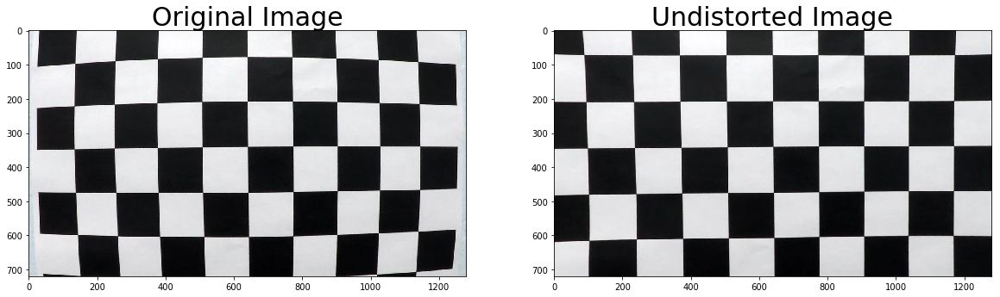

In [3]:
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])
global ret, mtx, dist, rvecs, tvecs
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Test undistortion on an image


# Undistorting image
dst = cv2.undistort(img,mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
plt.savefig('Original_UndistortedImage')

# Save the camera calibration result for later use (I won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )

## Test images

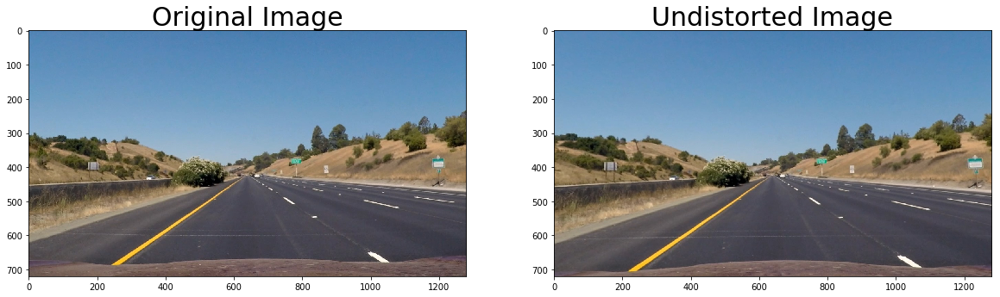

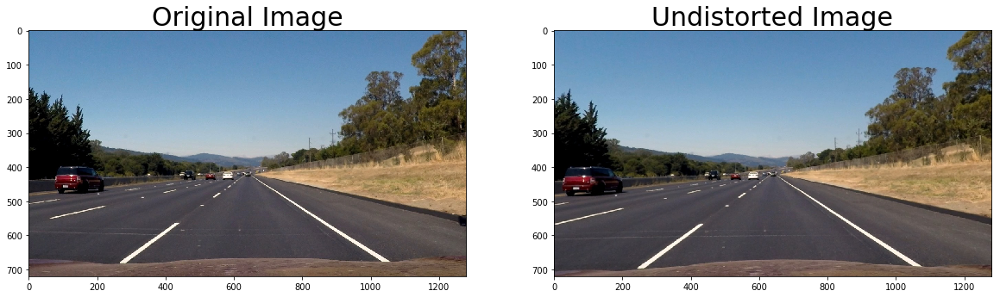

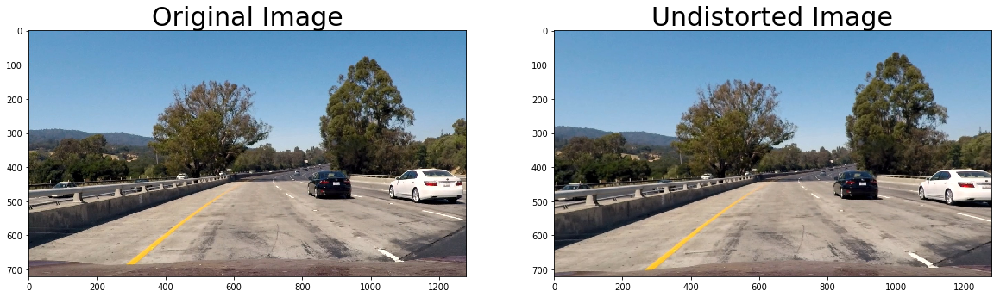

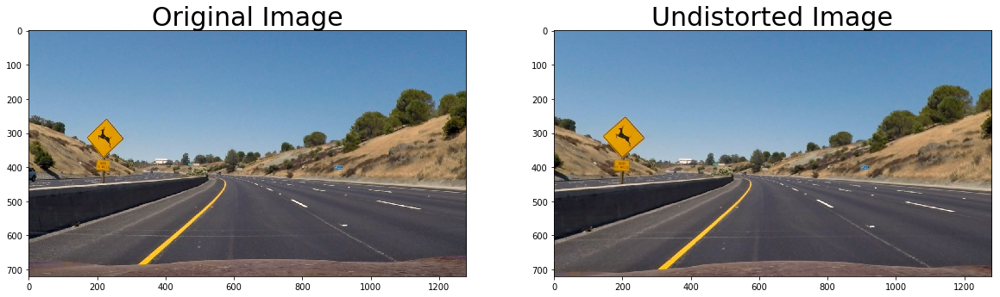

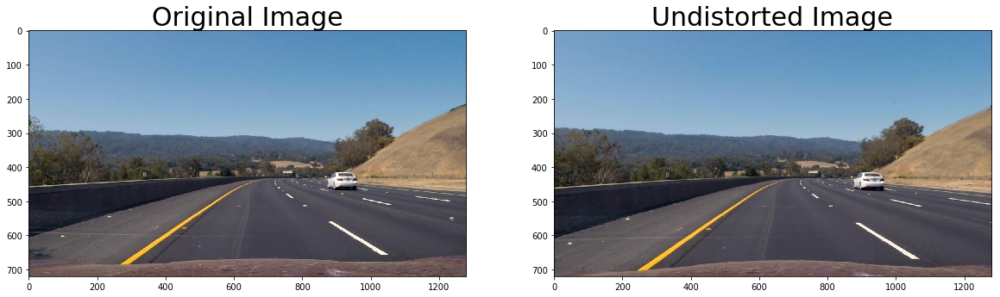

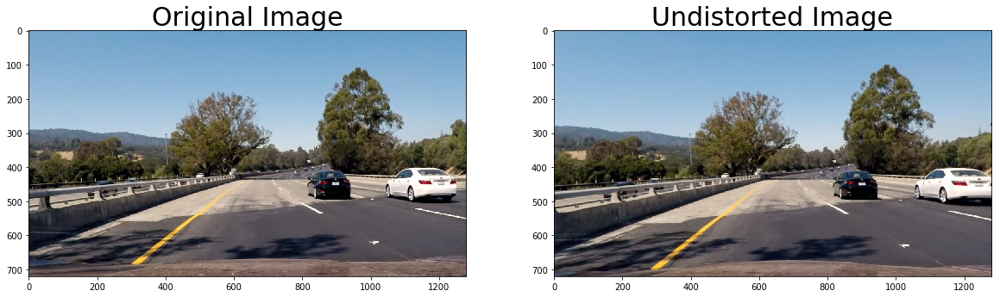

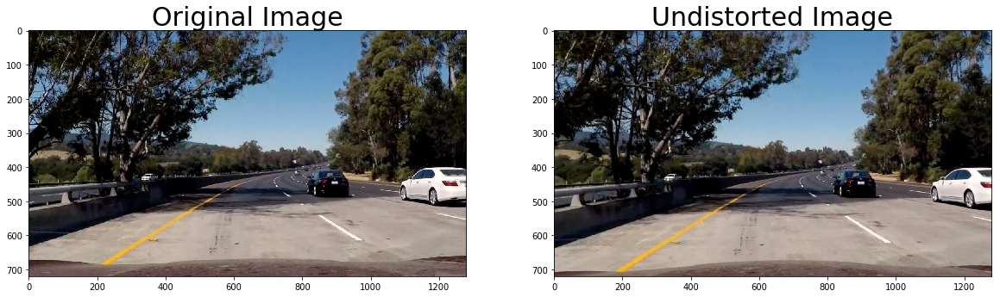

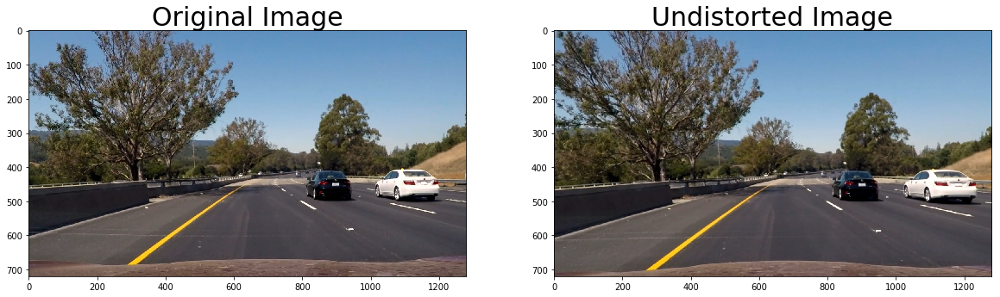

In [4]:
test_img_list =  list(map(lambda imageFileName: (imageFileName, cv2.imread(imageFileName)), 
                      glob.glob('test_images/*.jpg')))
for image_index in range(len(test_img_list)):
    imagePath = test_img_list[image_index][0]
    image = cv2.cvtColor(test_img_list[image_index][1],cv2.COLOR_BGR2RGB)
    # Undistorting Test image
    undistort = cv2.undistort(image,mtx, dist, None, mtx)
    # Visualize undistortion on test images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undistort)
    ax2.set_title('Undistorted Image', fontsize=30)
    #plt.savefig('test_distort{}'.format(image_index))
    plt.show()
    #plt.savefig('test_distort')

## Color transforms, gradients, etc., to create a thresholded binary image

In [5]:
# Calculate directional gradient
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Apply threshold
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        
    abs_sobel = np.absolute(sobel)
    scaled = np.uint8(255*abs_sobel / np.max(abs_sobel))
    
    grad_binary = np.zeros_like(scaled)
    grad_binary[(scaled >= thresh[0]) & (scaled <= thresh[1])] = 1
    
    return grad_binary



In [6]:
def mag_dir(img, sobel_kernel=9, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    abs_sobel = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>=mag_thresh[0])&(scaled_sobel<=mag_thresh[1])] = 1
    return binary_output

In [7]:
def dir_threshold(img, sobel_kernel=15, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    dir_grad = np.arctan2(abs_sobely,abs_sobelx)
    #scaled_sobel = np.uint8(255*dir_grad/np.max(dir_grad))
    binary_output = np.zeros_like(dir_grad)
    binary_output[(dir_grad>=thresh[0])&(dir_grad<=thresh[1])] = 1
    return binary_output

In [8]:
def LAB_thresh(img, thresh=(0, 255)):
    lab = cv2.cvtColor(img,cv2.COLOR_RGB2LAB)
    B = lab[:,:,2]
    binary_B = np.zeros_like(B)
    binary_B[(B > thresh[0])&(B <= thresh[1])] = 1
    return binary_B

def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    binary_output = np.zeros_like(s)
    binary_output[(s >  thresh[0]) & (s <= thresh[1])] = 1
    return binary_output

def hls_select_lightness(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    L = hls[:,:,1]
    binary_output = np.zeros_like(L)
    binary_output[(L > thresh[0]) & (L <= thresh[1])] = 1
    return binary_output

def color_lines(image):
    
    img = np.copy(image)
    
    lower = np.uint8([  0,   0, 200])
    upper = np.uint8([  0,   0, 255])
    red_mask = cv2.inRange(img, lower, upper)
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)
    
    lower = np.uint8([  0, 200,   0])
    upper = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(hls, lower, upper)
    
    lower = np.uint8([ 5,   0, 100])
    upper = np.uint8([ 60, 255, 255])
    yellow_mask = cv2.inRange(hls, lower, upper)
    # combine the mask
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    
    combined_binary = cv2.bitwise_and(image, image, mask = mask)
    
    combined_binary = cv2.cvtColor(combined_binary, cv2.COLOR_RGB2GRAY).astype(np.float)/255
    
    return combined_binary

In [9]:
def color_combined(undistort):
    ksize= 3
     # Gradient in X direction
    gradx = abs_sobel_thresh(undistort, orient='x', sobel_kernel=ksize, thresh=(50, 100))
    # Gradient in Y direction
    grady = abs_sobel_thresh(undistort, orient='y', sobel_kernel=ksize, thresh=(50, 100))
     # Gradient Magnitude
    mag_binary = mag_dir(undistort, sobel_kernel=ksize, mag_thresh=(70, 100))
    #plt.imshow(mag_binary,cmap='gray')
    #plt.show()
    # Gradient Direction
    dir_binary = dir_threshold(undistort, sobel_kernel=ksize, thresh=(0.3, 0.9))
    #plt.imshow(dir_binary, cmap='gray')
    #plt.show()
    # Saturation Value from HLS Colorspace
    s_binary = hls_select(undistort, thresh=(180, 255))
    #plt.imshow(s_binary, cmap='gray')
    #plt.show()
    # Lightness Value from HSL Colorspace
    l_binary = LAB_thresh(undistort, thresh=(130, 255))
    #plt.imshow(dir_binary, cmap='gray')
    #plt.show()
    #l_binary = hls_select_lightness(undistort, thresh=(80, 255))
    
    combined_binary = color_lines(undistort)
    #plt.imshow(combined_binary)
    #plt.show()
    
    color_combined = np.zeros_like(s_binary)
    color_combined[((gradx == 1) & (grady == 1)) | 
                    ((mag_binary == 1) & (dir_binary == 1) | (s_binary == 1)) &
                   ((s_binary == 1) & (l_binary == 1)) |(combined_binary > 0)]=1
    # Combine HLS and Lab B channel thresholds
    #color_combined = np.zeros_like(s_binary)
    #color_combined = combined_binary
    return color_combined
#)]=1

In [10]:
def unwarp(img):
    # calculator the vertices of the region of interest
    img_size = (img.shape[1], img.shape[0])
    #src = np.float32([[590, 450],[690, 450],
    #                  [1100, 720],[215,720]])
     #Destination image points
    #dst = np.float32([[340, 0], [940, 0], 
    #                 [940, 720],[340,720]])
    src = np.float32(
        [[273,680],
         [1046,680],
         [585,455],
         [700,455]])

    dst = np.float32(
        [[300,720],
         [980,720],
         [300,0],
         [980,0]])
#    src = np.float32([[0, 673], [1207, 673], [0, 450], [1280, 450]])
#    dst = np.float32([[569, 223], [711, 223], [0, 0], [1280, 0]])
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size,flags = cv2.INTER_LINEAR)
    #warped = cv2.cvtColor(warped,cv2.COLOR_BGR2RGB)
    return warped, M_inv

In [12]:
def pipeline(img):
    #img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    undistort=cv2.undistort(img, mtx, dist, None, mtx)
    warped_img, M_inv = unwarp(undistort)
    combined_img=color_combined(warped_img)
    
   
    return combined_img,undistort,M_inv

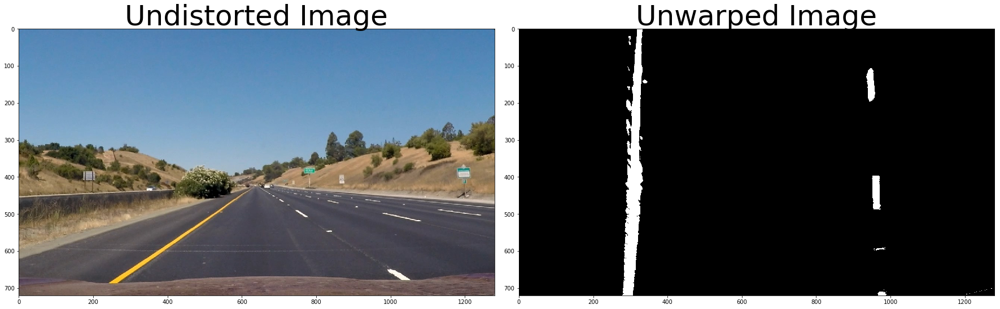

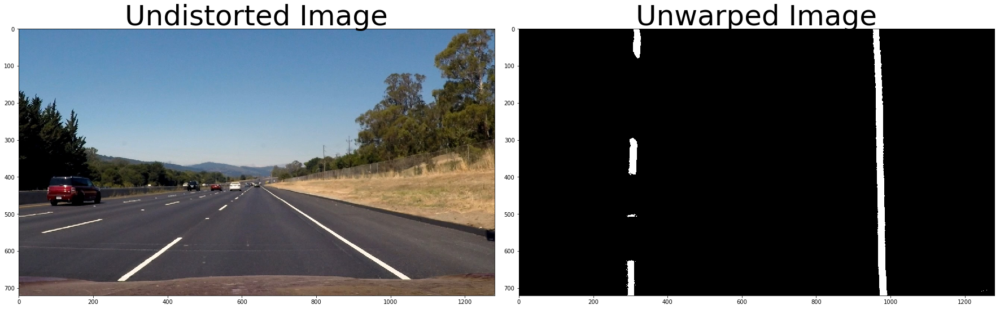

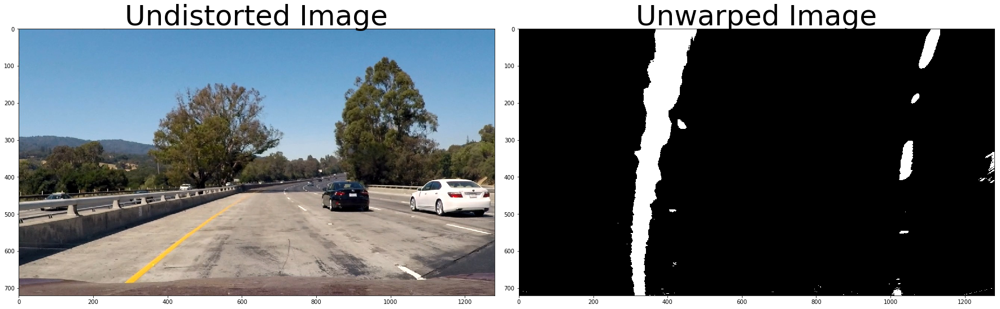

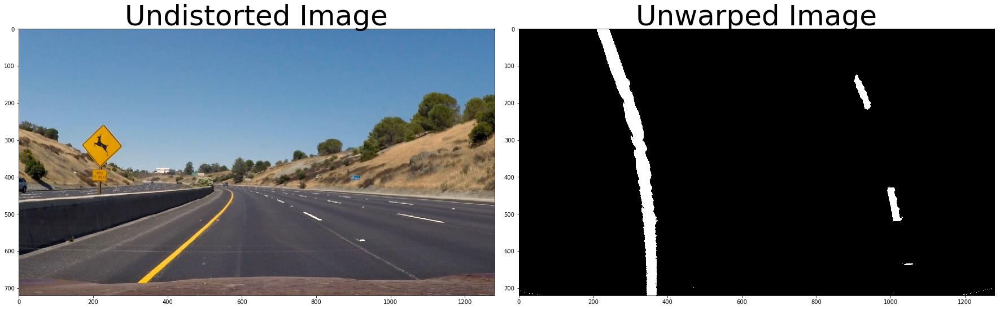

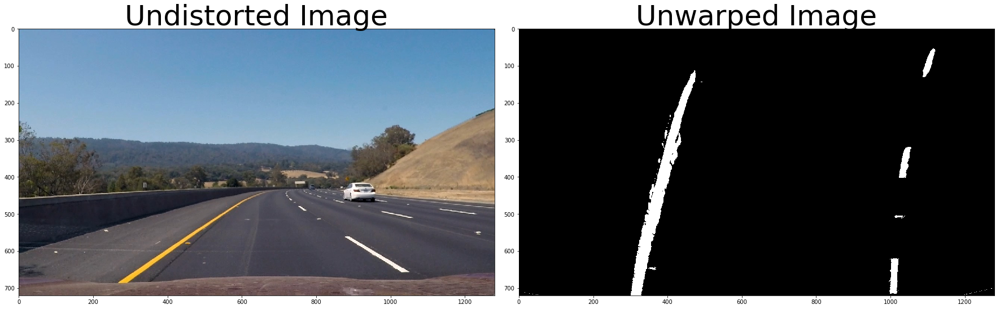

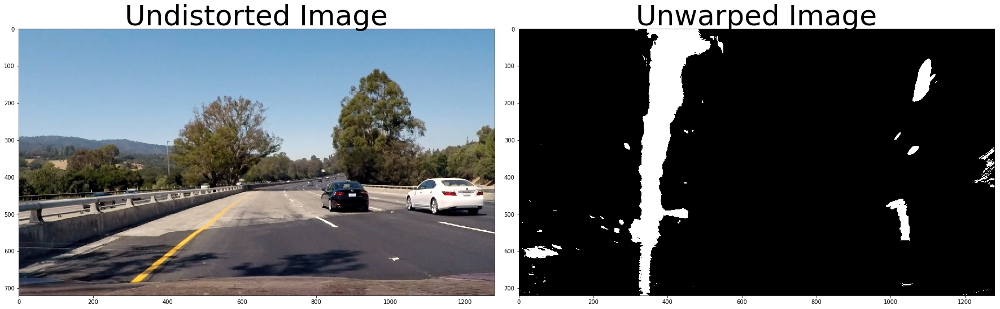

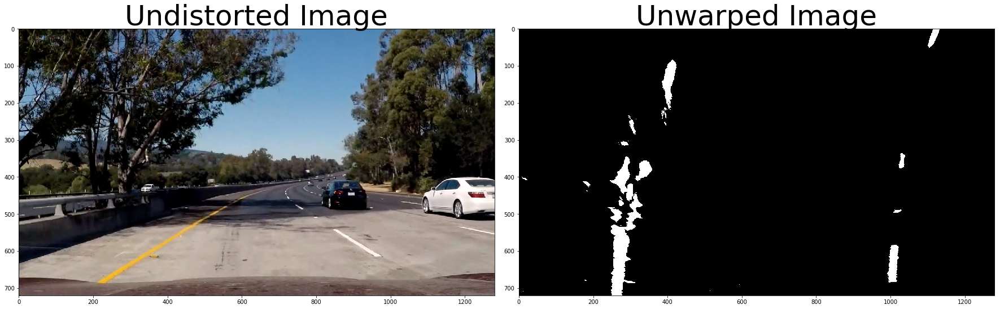

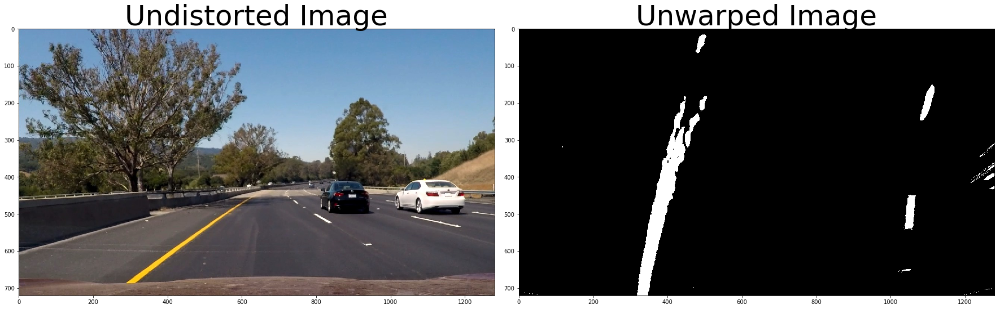

In [13]:
# Test on test images
for image_index in range(len(test_img_list)):
    image = cv2.cvtColor(test_img_list[image_index][1],cv2.COLOR_BGR2RGB)
    #roi = region_of_interest(image)
    combined_img,undistort,M_inv= pipeline(image)
   # Plot the 2 images side by side
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Undistorted Image', fontsize=50)
    ax2.imshow(combined_img, cmap='gray')
    ax2.set_title('Unwarped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    #plt.savefig('unwarp_distort{}'.format(image_index))
    plt.show()

## Histogram of warped Image

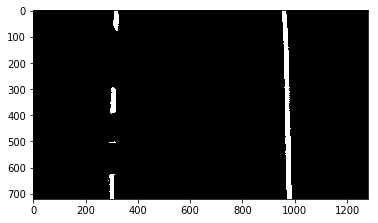

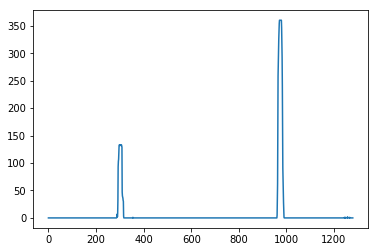

In [14]:
image = cv2.cvtColor(test_img_list[1][1],cv2.COLOR_BGR2RGB)
combined_img,undistort,M_inv = pipeline(image)
plt.imshow(combined_img,cmap='gray')
plt.savefig('hist1')
plt.show()
histogram = np.sum(combined_img[combined_img.shape[0]//2:,:], axis=0)
plt.plot(histogram)
plt.savefig('hist2')

In [15]:
def window_search(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 85
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    return out_img,left_fit, left_fitx,leftx,lefty,right_fit,right_fitx,rightx,righty,left_lane_inds, right_lane_inds


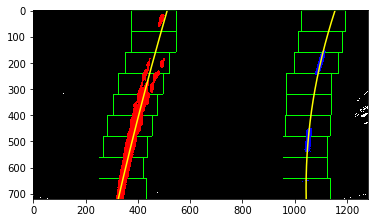

In [16]:
image_index = 7
image = cv2.cvtColor(test_img_list[image_index][1],cv2.COLOR_BGR2RGB)
combined_img,undistort,M_inv = pipeline(image)
ploty = np.linspace(0, combined_img.shape[0]-1, combined_img.shape[0] )
out_img,left_fit, left_fitx,leftx,lefty,right_fit,right_fitx,rightx,righty,left_lane_inds, right_lane_inds = window_search(combined_img)
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.savefig("window_search2")

In [17]:
def polyfit_using_prev_fit(binary_warped, left_fit_prev, right_fit_prev):
    # I know the whre the lines are 
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 85
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fit_new = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit_new = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    return left_fit_new, right_fit_new,left_fit, right_fit,leftx,lefty,rightx,righty,left_lane_inds, right_lane_inds


In [18]:
left_fit_new, right_fit_new,left_fit, right_fit,leftx,lefty,rightx,righty,left_lane_inds, right_lane_inds = polyfit_using_prev_fit(combined_img,left_fit,right_fit)

In [19]:
def visualisation(binary_warped,left_fitx,right_fitx):
    # Create an image to draw on and an image to show the selection window
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 85
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return result


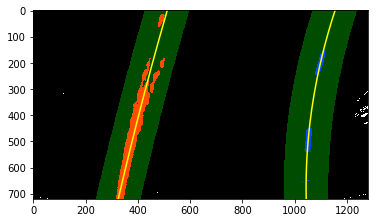

In [20]:
result = visualisation(combined_img,left_fit_new,right_fit_new)
plt.plot(left_fit_new, ploty, color='yellow')
plt.plot(right_fit_new, ploty, color='yellow')
plt.imshow(result)
#plt.savefig('prev_win_search')

In [21]:
def project_lines(binary_img, left_fit, right_fit,M_inv, undistorted):
    new_img = np.copy(undistorted)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape[0],binary_img.shape[1]
    
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

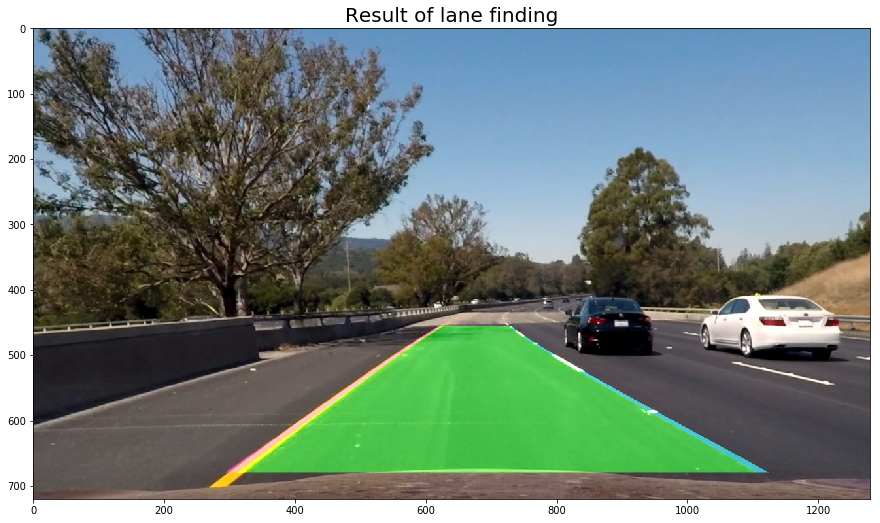

In [22]:
result = project_lines(combined_img,left_fit, right_fit, M_inv, undistort)
plt.figure(figsize=(15,10))
plt.imshow(result)
plt.title('Result of lane finding', fontsize=20)

In [23]:
def curverad(final,left_fitx, right_fitx):
    # Image size
    h,w = final.shape[0],final.shape[1]
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    center_curverad = (left_curverad + right_curverad)/2
    car_position = w/2
    lane_center_position = (left_fitx[719] + right_fitx[719]) / 2
    center_dist = (car_position - lane_center_position) * xm_per_pix
    return center_curverad, left_curverad, right_curverad, center_dist


In [24]:
center_curve,left_curve, right_curve, center_dis = curverad(result ,left_fitx, right_fitx)

...


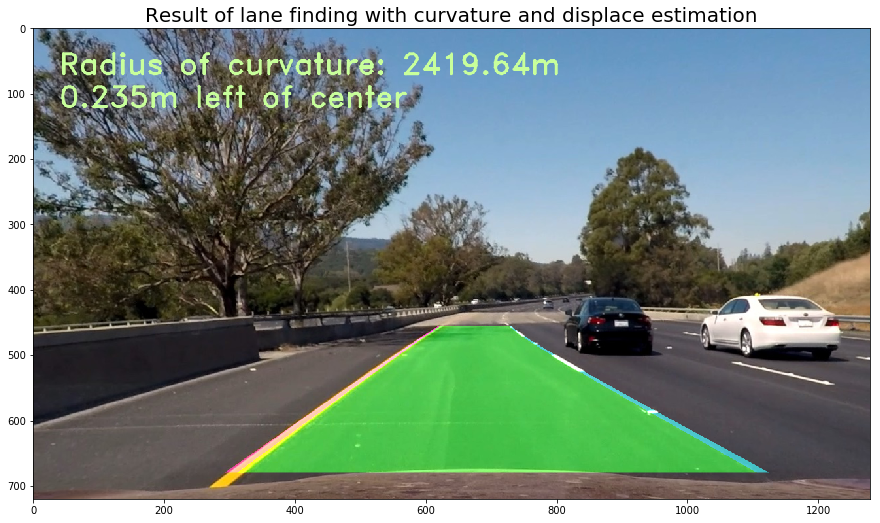

In [25]:
# draw data on the image
def write_on_Image(original_img, left_curve,right_curve,center_dist):
    test_img = np.copy(original_img)
    h = test_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    rds_of_curve = (left_curve +right_curve)/2
    text = 'Radius of curvature: ' + '{:04.2f}'.format(rds_of_curve) + 'm'
    cv2.putText(test_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    #cv2.putText(test_img, text2, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    else:
        direction = 'left'
    text = '{:04.3f}'.format(abs(center_dist)) + 'm '+ direction + ' of center'
    cv2.putText(test_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return test_img
print('...')

final = write_on_Image(result, left_curve, right_curve, center_dis)
plt.figure(figsize=(15,10))
plt.imshow(final)
plt.title('Result of lane finding with curvature and displace estimation', fontsize=20)

In [26]:

def process(img):
    combined_img,undistort_img,M_inv = pipeline(img)
    out_img,left_fit, left_fitx,leftx,lefty,right_fit,right_fitx,rightx,righty,left_lane_inds, right_lane_inds = window_search(combined_img)
    center_curve,left_curve, right_curve, center_dis = curverad(combined_img,left_fitx, right_fitx)
    result = project_lines(combined_img,left_fit, right_fit, M_inv, undistort_img)
    output_image = write_on_Image(result, left_curve, right_curve, center_dis)
    return output_image

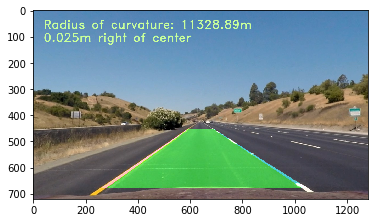

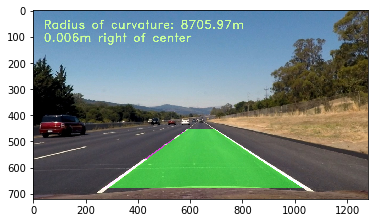

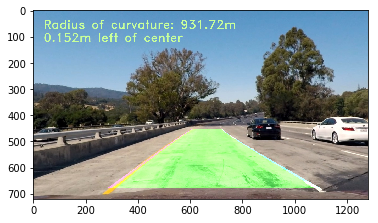

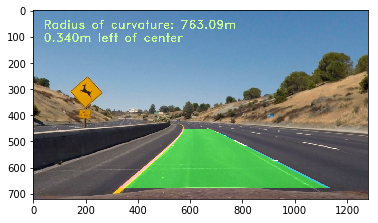

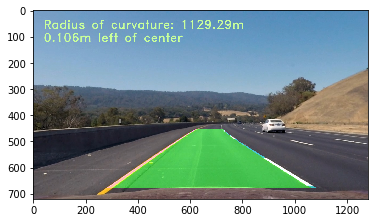

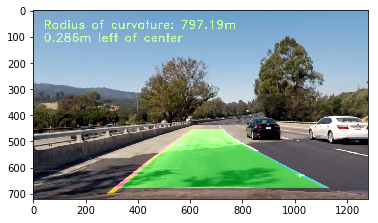

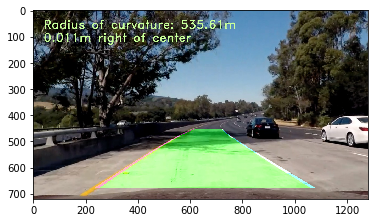

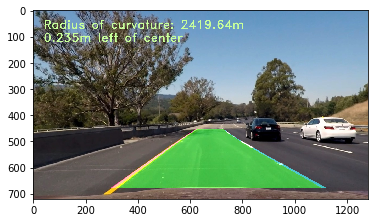

In [27]:
for image_index in range(len(test_img_list)):
    image = cv2.cvtColor(test_img_list[image_index][1],cv2.COLOR_BGR2RGB)
    final = process(image)
    plt.imshow(final)
    #plt.savefig('result{}'.format(image_index))
    plt.show()

In [28]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [29]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
def update_lane_data(left_fit, right_fit, left_fitx, right_fitx):
    left_lane.best_fit = left_fit
    right_lane.best_fit = right_fit
    left_lane.allx = left_fitx
    right_lane.allx = right_fitx

def lanes_found(binary_warped):
    min_peak_found = 50
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:, :], axis=0)
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    if leftx_base < min_peak_found or rightx_base < min_peak_found:
        return False
    return True

def sanity_check_pass(left_fit, right_fit):
    # Similar Curvature
    diff = abs(left_lane.radius_of_curvature - right_lane.radius_of_curvature)
    if diff > 500:
        return False
    left_fit_diff = np.abs(left_fit[0] - left_lane.best_fit[0])
    left_check = min(abs(left_fit[0]), abs(left_lane.best_fit[0])) / left_fit_diff
    right_fit_diff = np.abs(right_fit[0] - right_lane.best_fit[0])
    right_check = min(abs(right_fit[0]), abs(right_lane.best_fit[0])) / right_fit_diff
    if left_check <= 0.5 or right_check <= 0.5:
        return False
    # Lines separated by approximately the right distance
    return True
def process_video(img):
    global frames_used
    global frames_not_detected_line
    frames_used += 1
    #img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    combined_img,undistort_img,M_inv = pipeline(img)  
    
    if left_lane.detected == False and right_lane.detected == False:
        out_img,left_fit, left_fitx,leftx,lefty,right_fit,right_fitx,rightx,righty,left_lane_inds, right_lane_inds = window_search(combined_img)        
        center_curve,left_curve, right_curve, center_dis = curverad(combined_img,left_fitx, right_fitx)
        #print(center_curve,left_curve, right_curve, center_dis)
        left_lane.radius_of_curvature = left_curve
        right_lane.radius_of_curvature = right_curve
        left_lane.line_base_pos = center_dis
        left_lane.detected = True
        right_lane.detected = True
        update_lane_data(left_fit, right_fit, left_fitx, right_fitx)
    else:
        if lanes_found(combined_img) and frames_not_detected_line <= 1:
            left_fit_new, right_fit_new,left_fit, right_fit,leftx,lefty,rightx,righty,left_lane_inds, right_lane_inds= polyfit_using_prev_fit(combined_img, left_lane.best_fit, right_lane.best_fit)
            if sanity_check_pass(left_fit_new, right_fit_new) == True:
                update_lane_data(left_fit, right_fit,left_fit_new, right_fit_new)
                center_curve,left_curve, right_curve, center_dis = curverad(combined_img,left_fit_new, right_fit_new)
                #print(center_curve,left_curve, right_curve, center_dis)
                left_lane.radius_of_curvature = left_curve
                right_lane.radius_of_curvature = right_curve
                left_lane.line_base_pos = center_dis
            else:
                frames_not_detected_line += 1
                
        else:
            left_lane.detected = False
            right_lane.detected = False
            frames_not_detected_line = 0
    
    result = project_lines(combined_img,left_lane.best_fit, right_lane.best_fit, M_inv, undistort_img)
    output_image = write_on_Image(result, left_lane.radius_of_curvature, right_lane.radius_of_curvature,left_lane.line_base_pos)
    return output_image

In [29]:
left_lane = Line()
right_lane = Line()
frames_used = 0
frames_not_detected_line = 0
video_output = 'Project_video_output.mp4'
clip1 = VideoFileClip("./project_video.mp4")
challenge_clip = clip1.fl_image(process_video)
%time challenge_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video Project_video_output_3.mp4
[MoviePy] Writing video Project_video_output_3.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [06:37<00:00,  3.17it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: Project_video_output_3.mp4 

Wall time: 6min 39s


In [149]:
left_lane = Line()
right_lane = Line()
frames_used = 0
frames_not_detected_line = 0
video_output = 'HarderChallenge_video_output.mp4'
clip1 = VideoFileClip("./harder_challenge_video.mp4")
challenge_clip = clip1.fl_image(process_video)
%time challenge_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video HarderChallenge_video_output.mp4
[MoviePy] Writing video HarderChallenge_video_output.mp4


 69%|██████████████████████████████████████████████████████▍                        | 827/1200 [03:22<01:31,  4.09it/s]

TypeError: expected non-empty vector for x